In [11]:
# imports 
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from pytz import timezone
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from hurst import compute_Hc
register_matplotlib_converters()


In [12]:
def download_4h_data(symbols, start_date, end_date):

    try:
        data = yf.download(symbols, start=start_date, end=end_date, interval='1h')['Close']
        # Resample to 4-hour intervals
        data = data.resample('4h').last()
    except: 
        SyntaxError("Exception in downloading data")
    data.replace([np.inf, -np.inf], np.nan, inplace=True)
    data.dropna(inplace=True)
    # data = data.reset_index()
    # timestamp_column_name = data.columns[0]  # Assuming the timestamp is the first column
    # data = data[[timestamp_column_name, 'Close']]
    # data.columns = ['timestamp', 'price']
    # print(symbol, start_date, end_date, interval, data.shape[0])
    return data

# HW6 Begins from here!

In [13]:
def bb_strategy(data, lookback=30):
    wallet = 1
    cash = data['Close'][0]
    data['Equity'] = 2 * data['Close'][0]
    # Calculate SMA and SD
    data['SMA'] = data['Close'].rolling(window=lookback).mean()
    data['SD'] = data['Close'].rolling(window=lookback).std()

    data['Upper_Band'] = data['SMA'] + 2 * data['SD']
    data['Lower_Band'] = data['SMA'] - 2 * data['SD']
    data['exUpper_Band'] = data['SMA'] + 4 * data['SD'] #Extra upper band
    data['exLower_Band'] = data['SMA'] - 4 * data['SD'] #Extra lower band

    data['Position'] = 0
    for i in range(31, len(data)):
        if data['Close'][i] <data['SMA'][i] + data["SD"][i] and data['Close'][i] > data['SMA'][i] - data["SD"][i]:
            data['Position'][i] = 0
            
        elif (data['Close'][i] > data['exUpper_Band'][i]) & (data['Close'][i-1] < data['exUpper_Band'][i-1]) and wallet>=0.5:
            data['Position'][i] = -0.5 
            wallet -=0.5
            cash += 0.5 * data['Close'][i] 
        elif (data['Close'][i] > data['Upper_Band'][i]) & (data['Close'][i-1] < data['Upper_Band'][i-1]) and wallet>=0.5:
            data['Position'][i] = -0.5 
            wallet -= 0.5
            cash += 0.5 * data['Close'][i] 
           
        elif (data['Close'][i] < data['exLower_Band'][i]) & (data['Close'][i-1] > data['exLower_Band'][i-1]) and cash >= 0.5 * data['Close'][i]:
            data['Position'][i] = 1.0 
            wallet +=0.5 
            cash -= 0.5 * data['Close'][i]
        elif (data['Close'][i] < data['Lower_Band'][i]) & (data['Close'][i-1] > data['Lower_Band'][i-1]) and cash >= 0.5 * data['Close'][i]:
            data['Position'][i] = 0.5  
            wallet +=0.5
            cash -= 0.5 * data['Close'][i] * wallet
        else:
            pass
        
        data['Equity'][i]  = cash + data['Close'][i] * wallet

    return data

In [14]:
def calculate_sharp(df:pd.DataFrame):
    risk_free_rate = 0.00
    df['excess_returns'] = df['Equity'] - risk_free_rate

    sharp_ratio = np.sqrt(len(df)) * df['excess_returns'].mean() / df['excess_returns'].std() 
    return sharp_ratio
    

In [15]:
def plot_close_bands(data, name = "",print_extra=False, ):
    plt.figure(figsize=(16, 6))
    plt.plot(data.index, data['Close'], label='Close Price', color='black')
    plt.plot(data.index, data['SMA'], label='Simple Moving Average (SMA)', color='blue')
    plt.plot(data.index, data['Upper_Band'], label='Upper Band', color='red', linestyle='--')
    plt.plot(data.index, data['Lower_Band'], label='Lower Band', color='lime', linestyle='--')
    if print_extra:
        plt.plot(data.index, data['exUpper_Band'], label='Extreme Upper Band', color='brown', linestyle='--')
        plt.plot(data.index, data['exLower_Band'], label='ExtremeLower Band', color='green', linestyle='--')
    plt.title('Bollinger Bands Strategy'+name)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()  

In [16]:
def plot_equity(data):
    plt.figure(figsize=(16, 6))
    plt.plot(data.index, data['Equity'], label='Equity', color='purple', )
    # plt.plot(data.index, data['Equity'], label='equity', color='purple', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('Equity')
    plt.legend()
    plt.show()

In [17]:
data_list = []
with open('output.txt', 'r') as f:
    lines = f.read().split('----\n')
    for line in lines:
        if line.strip():  # this will ignore any empty lines
            pair, numbers = line.split('\n')[:2]
            pair1, pair2 = pair.replace('\'', '').split(', ')
            num1, num2 = map(float, numbers.split())
            data_list.append([pair1,pair2, num1, num2])

print(*data_list, sep = '\n')



['BTC-USD', 'USDT-USD', 1.64642604e-05, -975.239265]
['BTC-USD', 'SOL-USD', 0.00025146, -0.23745998]
['BTC-USD', 'USDC-USD', 1.12410297e-05, -261.601355]
['BTC-USD', 'XRP-USD', 0.000234532559, -15.0526951]
['BTC-USD', 'DOGE-USD', 8.90779426e-05, 86.2475789]
['ETH-USD', 'USDT-USD', 0.000605030251, -979.749463]
['ETH-USD', 'USDC-USD', 0.000130019273, -261.425629]
['ETH-USD', 'STETH-USD', 0.11448221, -0.11140246]
['ETH-USD', 'DOGE-USD', 78.9136617, 0.00153942557]
['USDT-USD', 'SOL-USD', 0.0206361921, -973.833195]
['USDT-USD', 'USDC-USD', 326.49657454, 939.84355958]
['USDT-USD', 'USDC-USD', -67.3532053, 803.95008146]
['USDT-USD', 'STETH-USD', 0.000569620698, -975.351377]
['USDT-USD', 'BNB-USD', 0.00598294543, -996.132322]
['USDT-USD', 'XRP-USD', 978.17187506, 1.65003243]


In [18]:
start_date = datetime(2022, 11, 1, tzinfo=timezone('Asia/Tehran'))
end_date = datetime(2023, 11, 1, tzinfo=timezone('Asia/Tehran'))

In [ ]:
for i in range(len(data_list)):
    data = download_4h_data([data_list[i][0],data_list[i][1]],start_date, end_date)
    data["Close"] = (data[data_list[i][0]] * data_list[i][2]) + (data[data_list[i][1]] * data_list[i][3] ) 
    data = bb_strategy(data)
    print(f"Result for combination of {data_list[i][0]} and {data_list[i][1]}")
    plot_close_bands(data, f"{data_list[i][0]} - {data_list[i][1]} {i}")
    plot_equity(data)
    print('Sharp ratio is: ', calculate_sharp(data))
    del data
    

[*********************100%%**********************]  2 of 2 completed


C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cash = data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data['Equity'] = 2 * data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['Close'][i] <data['SMA'][i] +

Result for combination of BTC-USD and DOGE-USD


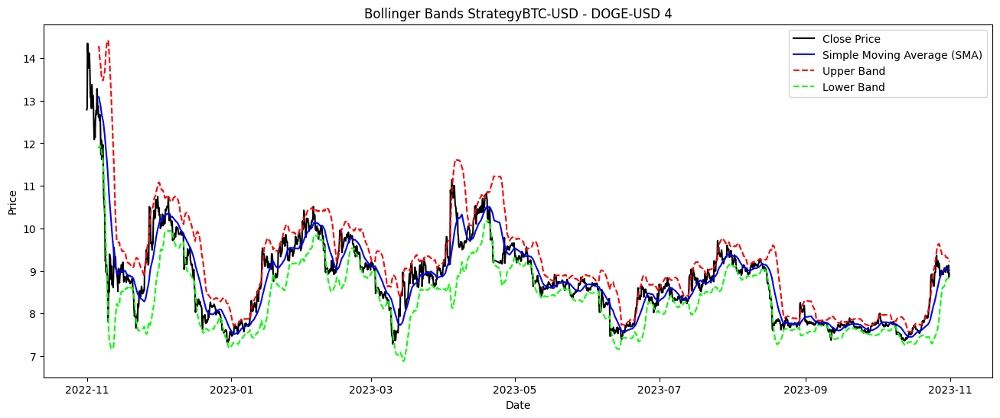

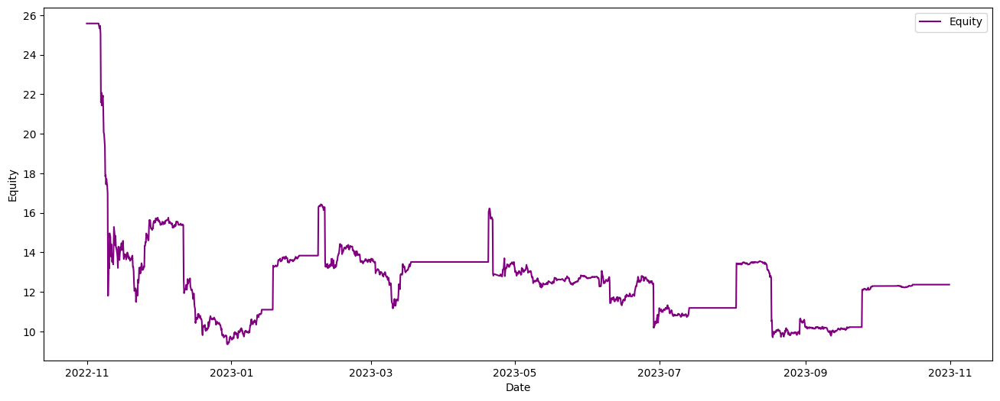

Sharp ratio is:  251.38329925485516
[*********************100%%**********************]  2 of 2 completed
Result for combination of ETH-USD and STETH-USD


C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cash = data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data['Equity'] = 2 * data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['Close'][i] <data['SMA'][i] +

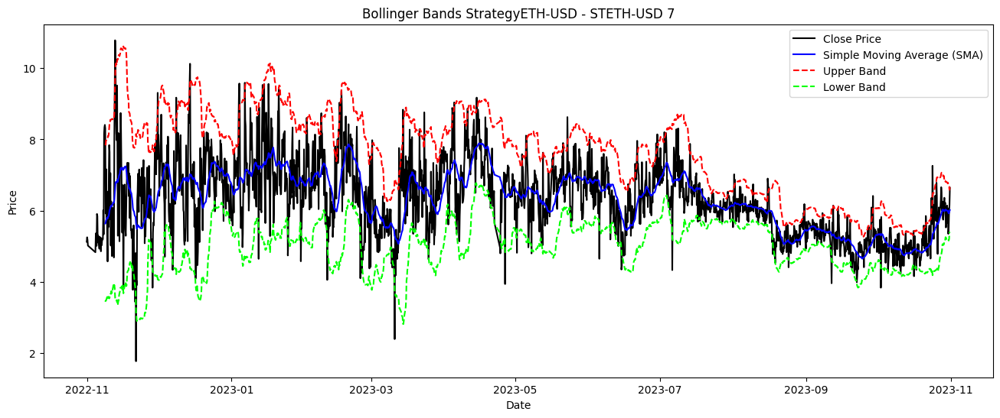

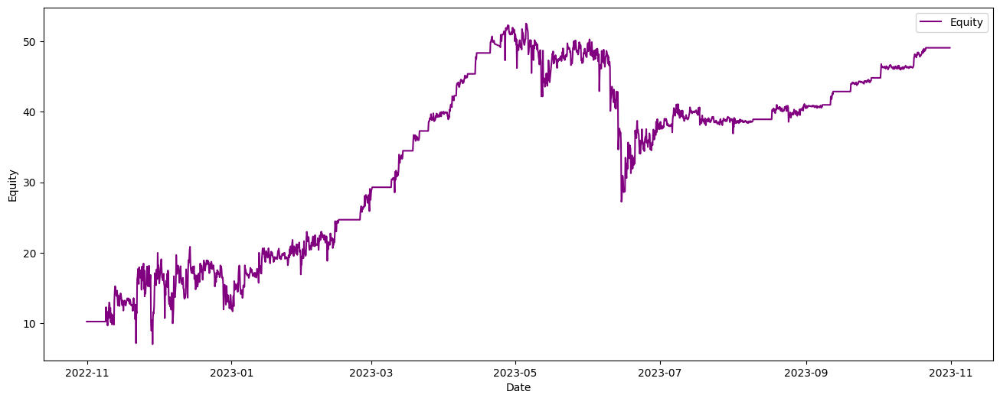

Sharp ratio is:  126.50838524857495
[*********************100%%**********************]  2 of 2 completed


C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cash = data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data['Equity'] = 2 * data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['Close'][i] <data['SMA'][i] +

Result for combination of ETH-USD and DOGE-USD


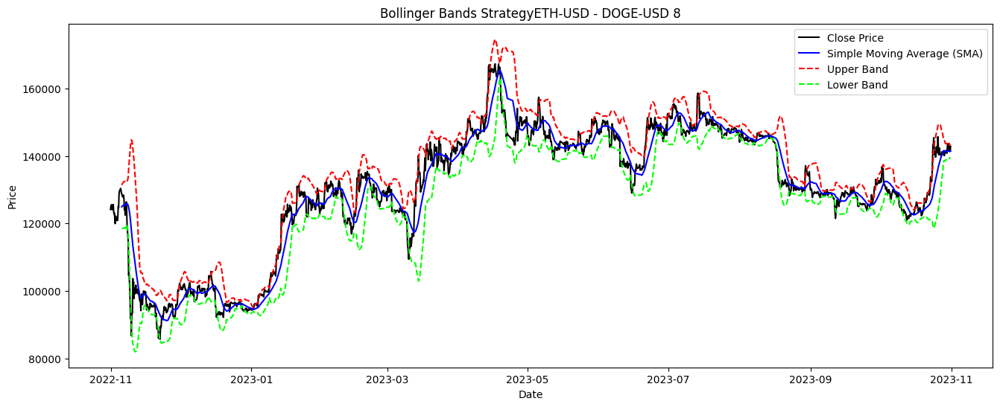

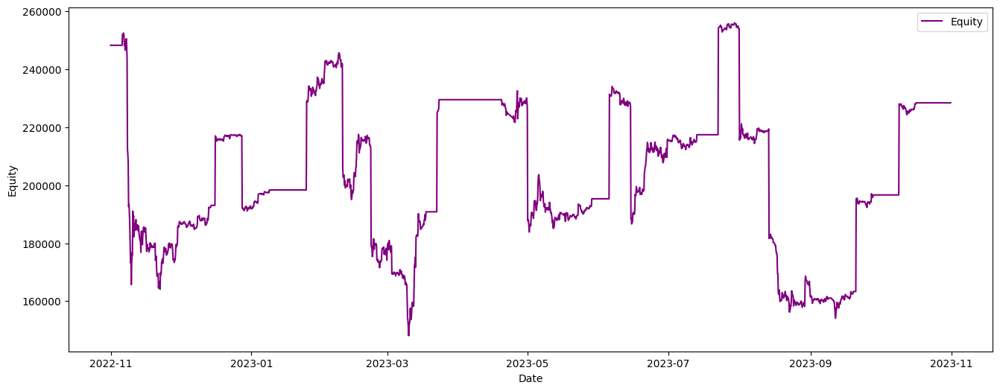

Sharp ratio is:  379.6800346985102
[*********************100%%**********************]  2 of 2 completed


C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cash = data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data['Equity'] = 2 * data['Close'][0]
C:\Users\user\AppData\Local\Temp\ipykernel_16176\3188431128.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if data['Close'][i] <data['SMA'][i] +

Result for combination of USDT-USD and USDC-USD


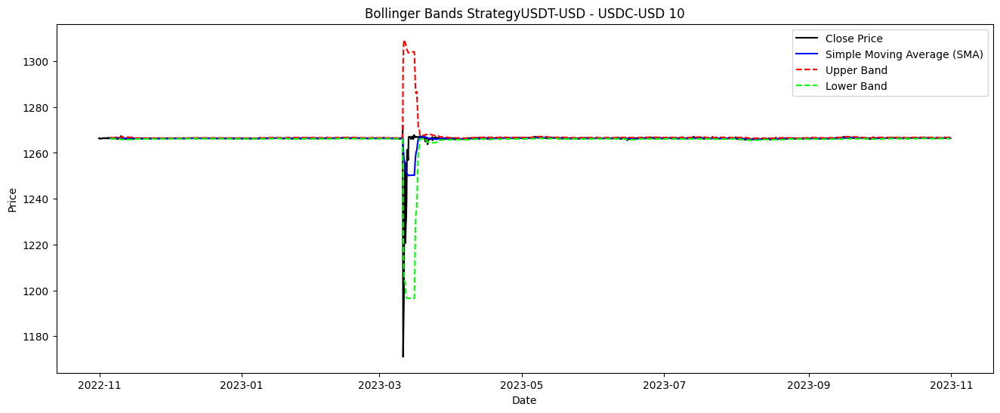

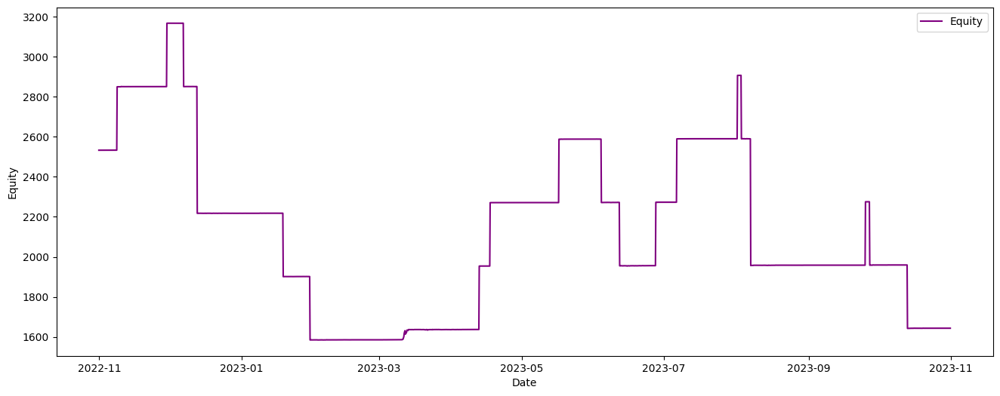

Sharp ratio is:  237.99084401580257


In [20]:
for i in [4,7,8,10]:
    data = download_4h_data([data_list[i][0],data_list[i][1]],start_date, end_date)
    data["Close"] = (data[data_list[i][0]] * data_list[i][2]) + (data[data_list[i][1]] * data_list[i][3] ) 
    data = bb_strategy(data)
    print(f"Result for combination of {data_list[i][0]} and {data_list[i][1]}")
    plot_close_bands(data, f"{data_list[i][0]} - {data_list[i][1]} {i}")
    plot_equity(data)
    print('Sharp ratio is: ', calculate_sharp(data))
    del data
    

In [ ]:
del data

In [ ]:
data["Close"] = (data[data_list[4][0]] * data_list[4][2]) + (data[data_list[4][1]] * data_list[4][3] ) 

In [ ]:
data = download_4h_data([data_list[4][0],data_list[4][1]],start_date, end_date)

In [ ]:
data.to_csv('data.csv', index=True)